# Deblur Immagini
Il problema di deblur consiste nella ricostruzione di un immagine a partire da un dato acquisito mediante il seguente modello:

\begin{align*}
    b = A x + \eta
\end{align*}

dove $b$ rappresenta l'immagine corrotta, $x$ l'immagine originale che vogliamo ricostruire, $A$ l'operatore che applica il blur Gaussiano ed $\eta$ il rumore additivo con distribuzione Gaussiana di  media $\mathbb{0}$ e deviazione standard $\sigma$.

## Funzioni di blur
Le seguenti funzioni servono per applicare il blur di tipo gaussiano ad un'immagine.



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

dim = 512
path = "pics/"
# Create a Gaussian kernel of size kernlen and standard deviation sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)    
    # Unidimensional Gaussian kernel
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Bidimensional Gaussian kernel
    kern2d = np.outer(kern1d, kern1d)
    # Normalization
    return kern2d / kern2d.sum()

# Compute the FFT of the kernel 'K' of size 'd' padding with the zeros necessary
# to match the size of 'shape'
def psf_fft(K, d, shape):
    # Zero padding
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Shift
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1)

    # Compute FFT
    K_otf = fft.fft2(K_pr)
    return K_otf

# Multiplication by A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Multiplication by A transpose
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

## Generazione dataset
Generare un set di 8 immagini 512$\times$512 in formato ${\tt png}$ in scala dei grigi che contengano tra i 2 ed i 6 oggetti geometrici, di colore uniforme, su sfondo nero. 


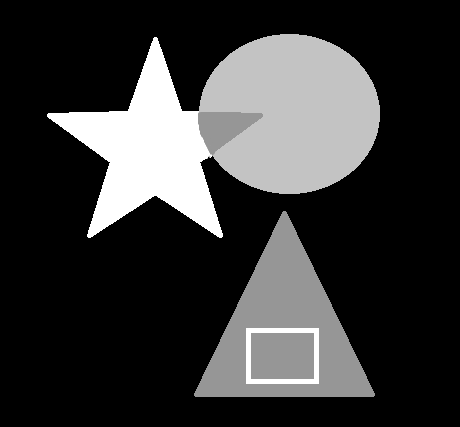


## 1) Generazione immagini corrotte
Degradare le immagini applicando, mediante le funzioni riportate nella cella precedente,  l'operatore di blur con parametri

+ $\sigma=0.5$ dimensione $5\times 5$
+ $\sigma=1$ dimensione $7\times 7$
+ $\sigma=1.3$ dimensione $9\times 9$

ed aggiungendo rumore gaussiano con deviazione standard $(0,0.05]$

In [ ]:
from skimage.io import imread

#Generate corrupted images with 3 different kernels and gaussian noise
def generate_images(path, sigma):
    X = imread(path, as_gray=True).astype(np.float64)
    m, n = X.shape
    
    K5 = psf_fft(gaussian_kernel(5, 0.5), 5, X.shape)
    K7 = psf_fft(gaussian_kernel(7, 1), 7, X.shape)
    K9 = psf_fft(gaussian_kernel(9, 1.3), 9, X.shape)

    noise = np.random.normal(size=X.shape) * sigma

    b5 = A(X, K5) + noise
    PSNR5 = metrics.peak_signal_noise_ratio(X, b5)
    MSE5 = metrics.mean_squared_error(X, b5)

    b7 = A(X, K7) + noise
    PSNR7 = metrics.peak_signal_noise_ratio(X, b7)
    MSE7 = metrics.mean_squared_error(X, b7)

    b9 = A(X, K9) + noise
    PSNR9 = metrics.peak_signal_noise_ratio(X, b9)
    MSE9 = metrics.mean_squared_error(X, b9)

    return X, b5, b7, b9, K5, K7, K9, PSNR5, PSNR7, PSNR9, MSE5, MSE7, MSE9

#Print a table with the results of generate_images and naive methods
def results(images, index):
  print("Image\tSigma\tPSNR5\tPSNR7\tPSNR9\tMSE5\tMSE7\tMSE9 \\\\")
  for i in range(len(images)):
    for s in range(1, len(images[i]) + 1):
      print(f'{index[i]}\t{s/100}\t{images[i][s-1]["PSNR5"]:.2f}\t{images[i][s-1]["PSNR7"]:.2f}\t{images[i][s-1]["PSNR9"]:.2f}\t{images[i][s-1]["MSE5"]:.5f}\t{images[i][s-1]["MSE7"]:.5f}\t{images[i][s-1]["MSE9"]:.5f} \\\\')


In [ ]:
images = []
#Corrupt images with different sigma for each kernel
for i in range(10):
    images.append([])
    for s in range(1, 6):
        X, b5, b7, b9, K5, K7, K9, PSNR5, PSNR7, PSNR9, MSE5, MSE7, MSE9 = generate_images(path+str(i)+".png", s/100)
        images[i].append({"X": X, "b5": b5, "b7": b7, "b9": b9, "K5": K5, "K7": K7, "K9": K9, "PSNR5": PSNR5, "PSNR7": PSNR7, "PSNR9": PSNR9, "MSE5": MSE5, "MSE7": MSE7, "MSE9": MSE9})

#Print the results table
print("\nImmagini Corrotte\n")
results(images, [x for x in range(10)])


Immagini Corrotte

Image	Sigma	PSNR5	PSNR7	PSNR9	MSE5	MSE7	MSE9 \\
0	0.01	36.66	34.72	34.03	0.00022	0.00034	0.00040 \\
0	0.02	32.88	31.95	31.57	0.00052	0.00064	0.00070 \\
0	0.03	29.91	29.43	29.21	0.00102	0.00114	0.00120 \\
0	0.04	27.67	27.37	27.23	0.00171	0.00183	0.00189 \\
0	0.05	25.83	25.63	25.54	0.00261	0.00273	0.00279 \\
1	0.01	34.26	31.76	30.91	0.00037	0.00067	0.00081 \\
1	0.02	31.72	30.16	29.55	0.00067	0.00096	0.00111 \\
1	0.03	29.29	28.33	27.93	0.00118	0.00147	0.00161 \\
1	0.04	27.27	26.63	26.35	0.00188	0.00217	0.00232 \\
1	0.05	25.56	25.13	24.93	0.00278	0.00307	0.00321 \\
2	0.01	34.97	32.30	31.34	0.00032	0.00059	0.00073 \\
2	0.02	32.09	30.52	29.86	0.00062	0.00089	0.00103 \\
2	0.03	29.54	28.60	28.17	0.00111	0.00138	0.00152 \\
2	0.04	27.39	26.79	26.50	0.00182	0.00209	0.00224 \\
2	0.05	25.65	25.24	25.03	0.00272	0.00299	0.00314 \\
3	0.01	34.38	31.94	31.13	0.00036	0.00064	0.00077 \\
3	0.02	31.77	30.27	29.70	0.00067	0.00094	0.00107 \\
3	0.03	29.35	28.43	28.05	0.00116	0.00144	0.00157

## 2) Soluzione naive

Una possibile ricostruzione dell'immagine originale $x$ partendo dall'immagine corrotta $b$ è la soluzione naive data dal minimo del seguente problema di ottimizzazione:
\begin{align}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2
\end{align}

La funzione $f$ da minimizzare è data dalla formula
  $f(x) = \frac{1}{2} ||Ax - b||_2^2 $, il cui gradiente $\nabla f$ è dato da
$\nabla f(x) = A^TAx - A^Tb  $.

Utilizzando il metodo del gradiente coniugato implementato dalla funzione `minimize` calcolare la soluzione naive. 

In [ ]:
from scipy.optimize import minimize

#Function to be minimized for naive method
def f(x, b, K):
    X = x.reshape(dim, dim)
    res = 1/2 * np.linalg.norm(A(X, K) - b, 2)**2
    return res

#Gradient of the above function
def df(x, b, K):
    X = x.reshape(dim, dim)
    res = AT(A(X, K), K) - AT(b, K)
    res = np.asarray(res).reshape(-1)
    return res

#Calculate the naive reconstruction of a corrupted image with sigma=s
def calculate_naive(i, s):
    res5 = minimize(f, x0, (images[i][s-1]["b5"], images[i][s-1]["K5"]), method='CG', jac=df)
    naive5 = res5.x.reshape(dim, dim)
    PSNR5 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], naive5)
    MSE5 = metrics.mean_squared_error(images[i][s-1]["X"], naive5)
    # plt.imshow(x, cmap='gray', vmin=0, vmax=1)
    res7 = minimize(f, x0, (images[i][s-1]["b7"], images[i][s-1]["K7"]), method='CG', jac=df)
    naive7 = res7.x.reshape(dim, dim)
    PSNR7 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], naive7)
    MSE7 = metrics.mean_squared_error(images[i][s-1]["X"], naive7)
    res9 = minimize(f, x0, (images[i][s-1]["b9"], images[i][s-1]["K9"]), method='CG', jac=df)
    naive9 = res9.x.reshape(dim, dim)
    PSNR9 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], naive9)
    MSE9 = metrics.mean_squared_error(images[i][s-1]["X"], naive9)
    return {"Naive5": naive5, "PSNR5": PSNR5, "MSE5": MSE5, "Naive7": naive7, "PSNR7": PSNR7, "MSE7": MSE7, "Naive9": naive9, "PSNR9": PSNR9, "MSE9": MSE9}


In [ ]:
naive = [[],[],[]]
x0 = np.zeros((1,dim*dim))

index = [0, 8, 9]
#Calculate naive reconstruction of of 3 images, each with multiple corruption parameters
for i in range(len(index)):
    for s in range(1, 6):
        naive[i].append(calculate_naive(index[i], s))

#Print the results of naive reconstruction
print("\nRicostruzione Naive\n")
results(naive, index)


Ricostruzione Naive

Image	Sigma	PSNR5	PSNR7	PSNR9	MSE5	MSE7	MSE9 \\
0	0.01	27.83	21.47	27.80	0.00165	0.00713	0.00166 \\
0	0.02	24.45	0.24	8.51	0.00359	0.94723	0.14092 \\
0	0.03	11.33	-4.91	11.53	0.07361	3.09836	0.07033 \\
0	0.04	8.87	-8.61	5.67	0.12974	7.26297	0.27124 \\
0	0.05	6.93	-9.53	0.69	0.20295	8.98363	0.85249 \\
8	0.01	20.93	7.01	25.17	0.00806	0.19891	0.00304 \\
8	0.02	14.90	14.18	16.56	0.03238	0.03820	0.02210 \\
8	0.03	18.40	16.93	10.35	0.01444	0.02025	0.09221 \\
8	0.04	8.83	-4.62	7.78	0.13090	2.89669	0.16673 \\
8	0.05	6.94	5.31	9.14	0.20226	0.29429	0.12194 \\
9	0.01	20.96	-1.10	14.25	0.00802	1.28777	0.03761 \\
9	0.02	14.91	-2.92	15.00	0.03229	1.95697	0.03166 \\
9	0.03	11.36	-7.75	9.47	0.07317	5.95165	0.11307 \\
9	0.04	8.85	-4.34	7.81	0.13021	2.71473	0.16543 \\
9	0.05	6.94	9.55	11.74	0.20210	0.11101	0.06702 \\


## 3) Regolarizzazione
Per ridurre gli effetti del rumore nella ricostruzione è necessario introdurre un termine di regolarizzazione di Tikhonov. Si considera quindi il seguente problema di ottimizzazione.
\begin{align*}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2 + \frac{\lambda}{2} ||x||_2^2
\end{align*}

La funzione $f$ da minimizzare diventa
$f(x) = \frac{1}{2} ||Ax - b||_2^2 + \frac{\lambda}{2} ||x||_2^2$
il cui gradiente $\nabla f$ è dato da
$\nabla f(x) = A^TAx - A^Tb + λx$.

Utilizzando il metodo del gradiente coniugato implementato dalla funzione `minimize` ed il metodo del gradiente implementato a lezione, calcolare la soluzione del precendente problema di minimo regolarizzato per differenti valori di $\lambda$. 

In [ ]:
#Function to be minimized with Tikhonov's regularization term
def fl(x, b, K, l):
    X = x.reshape(dim, dim)
    res = 1/2 * np.linalg.norm(A(X, K) - b, 2)**2 + l/2 * np.linalg.norm(X, 2)**2
    return res

#Gradient of the above function
def dfl(x, b, K, l):
    X = x.reshape(dim, dim)
    res = AT(A(X, K), K) - AT(b, K) + l * X
    res = np.asarray(res).reshape(-1)
    return res

#Calculate the reconstruction with conjugate gradient method of an image with sigma=s and lambda=l
def calculate_regular(i, s, l):
    res5 = minimize(fl, x0, (images[i][s-1]["b5"], images[i][s-1]["K5"], l/100), method='CG', jac=dfl)
    regular5 = res5.x.reshape(dim, dim)
    PSNR5 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular5)
    MSE5 = metrics.mean_squared_error(images[i][s-1]["X"], regular5)
    res7 = minimize(fl, x0, (images[i][s-1]["b7"], images[i][s-1]["K7"], l/100), method='CG', jac=dfl)
    regular7 = res7.x.reshape(dim, dim)
    PSNR7 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular7)
    MSE7 = metrics.mean_squared_error(images[i][s-1]["X"], regular7)
    res9 = minimize(fl, x0, (images[i][s-1]["b9"], images[i][s-1]["K9"], l/100), method='CG', jac=dfl)
    regular9 = res9.x.reshape(dim, dim)
    PSNR9 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular9)
    MSE9 = metrics.mean_squared_error(images[i][s-1]["X"], regular9)
    return {"Regular5": regular5, "PSNR5": PSNR5, "MSE5": MSE5, "Regular7": regular7, "PSNR7": PSNR7, "MSE7": MSE7, "Regular9": regular9, "PSNR9": PSNR9, "MSE9": MSE9}

#Print images reconstructed with regularization or total variation methods
def print_reg(images, index):
    print("Image\tSigma\tLambda\tPSNR5\tPSNR7\tPSNR9\tMSE5\tMSE7\tMSE9 \\\\")
    for i in range(len(images)):
        for s in range(1, len(images[i]) + 1):
            for l in range(1, len(images[i][s-1]) + 1):
                print(f'{index[i]}\t{s/100}\t{l/100}\t{images[i][s-1][l-1]["PSNR5"]:.2f}\t{images[i][s-1][l-1]["PSNR7"]:.2f}\t{images[i][s-1][l-1]["PSNR9"]:.2f}\t{images[i][s-1][l-1]["MSE5"]:.5f}\t{images[i][s-1][l-1]["MSE7"]:.5f}\t{images[i][s-1][l-1]["MSE9"]:.5f} \\\\')


In [ ]:
regular = []
x0 = np.array([1]*dim*dim)

#Calculate Tikhonov's reconstruction, using the conjugate gradient method, of 3 images, each with multiple corruption parameters
for i in range(len(index)):
    regular.append([])
    for s in range(1, 6):
        regular[i].append([])
        for l in range(1, 5):
            regular[i][s-1].append(calculate_regular(index[i], s, l))

#Print the reconstructed images
print("\nRegolarizzazione con gradiente coniugato\n")
print_reg(regular, index)


Regolarizzazione con gradiente coniugato

Image	Sigma	Lambda	PSNR5	PSNR7	PSNR9	MSE5	MSE7	MSE9 \\
0	0.01	0.01	33.06	31.70	32.64	0.00049	0.00068	0.00054 \\
0	0.01	0.02	31.37	32.94	35.49	0.00073	0.00051	0.00028 \\
0	0.01	0.03	32.44	35.41	34.12	0.00057	0.00029	0.00039 \\
0	0.01	0.04	33.75	32.60	34.48	0.00042	0.00055	0.00036 \\
0	0.02	0.01	31.50	28.87	31.90	0.00071	0.00130	0.00065 \\
0	0.02	0.02	29.12	32.18	29.08	0.00122	0.00061	0.00123 \\
0	0.02	0.03	29.48	33.80	30.14	0.00113	0.00042	0.00097 \\
0	0.02	0.04	32.93	32.28	33.45	0.00051	0.00059	0.00045 \\
0	0.03	0.01	28.23	29.66	29.13	0.00150	0.00108	0.00122 \\
0	0.03	0.02	28.85	29.46	31.10	0.00130	0.00113	0.00078 \\
0	0.03	0.03	24.18	28.43	30.40	0.00382	0.00143	0.00091 \\
0	0.03	0.04	31.78	31.77	31.52	0.00066	0.00067	0.00070 \\
0	0.04	0.01	27.62	28.55	28.61	0.00173	0.00140	0.00138 \\
0	0.04	0.02	26.76	26.57	26.04	0.00211	0.00220	0.00249 \\
0	0.04	0.03	26.92	28.80	29.40	0.00203	0.00132	0.00115 \\
0	0.04	0.04	30.63	31.20	31.11	0.00086	0.00076	0

In [ ]:
def next_step(x,grad, args): # backtracking procedure for the choice of the steplength
  alpha=1.1
  rho = 0.5
  c1 = 0.25
  p=-grad
  b = args[0]
  K = args[1]
  l = args[2]
  j=0
  jmax=10
  while ((fl(x+alpha*p[0], b, K, l) > fl(x, b, K, l)+c1*alpha*grad.T@p) and j<jmax ):
    alpha= rho*alpha
    j+=1
  if (j>jmax):
    return -1
  else:
    #print('alpha=',alpha)
    return alpha


#Minimization method with gradient as seen in class
def minimize_custom(f, x0, args, jac=dfl, step=0.01, MAXITERATION=50, ABSOLUTE_STOP=1.e-5):
    # declare x_k and gradient_k vectors
    norm_grad_list = []
    function_eval_list = []
    error_list = []

    # initialize first values
    x_last = x0
    b = args[0]
    K = args[1]
    l = args[2]

    function_eval_list.append(f(x_last, b, K, l))
    norm_grad_list.append(np.linalg.norm(jac(x_last, b, K, l)))
    error_list.append(np.linalg.norm(x_last-b.reshape(dim*dim)))

    k = 1
    while (norm_grad_list[-1] > ABSOLUTE_STOP and k < MAXITERATION):
        # direction is given by gradient of the last iteration
        grad = jac(x_last, b, K, l)

        # backtracking step
        step = next_step(x_last, grad, args)
        # Fixed step
        #step = 0.1

        if(step == -1):
            print('non convergente')
            return (k)  # no convergence

        x_last = x_last-step*grad

        function_eval_list.append(f(x_last, b, K, l))
        norm_grad_list.append(np.linalg.norm(jac(x_last, b, K, l)))
        error_list.append(np.linalg.norm(x_last-b.reshape(dim*dim)))
        k = k+1

    return x_last, k, error_list, function_eval_list, norm_grad_list

#Calculate the reconstruction with custom_minimize method of an image with sigma=s and lambda=l
def calculate_gradMethod(i, s, l):
    res5 = minimize_custom(fl, x0, (images[i][s-1]["b5"], images[i][s-1]["K5"], l/100), dfl)
    regular5 = res5[0].reshape(dim, dim)
    PSNR5 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular5)
    MSE5 = metrics.mean_squared_error(images[i][s-1]["X"], regular5)
    res7 = minimize_custom(fl, x0, (images[i][s-1]["b7"], images[i][s-1]["K7"], l/100), dfl)
    regular7 = res7[0].reshape(dim, dim)
    PSNR7 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular7)
    MSE7 = metrics.mean_squared_error(images[i][s-1]["X"], regular7)
    res9 = minimize_custom(fl, x0, (images[i][s-1]["b9"], images[i][s-1]["K9"], l/100), dfl)
    regular9 = res9[0].reshape(dim, dim)
    PSNR9 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular9)
    MSE9 = metrics.mean_squared_error(images[i][s-1]["X"], regular9)
    return {"Regular5": regular5, "PSNR5": PSNR5, "MSE5": MSE5, "Regular7": regular7, "PSNR7": PSNR7, "MSE7": MSE7, "Regular9": regular9, "PSNR9": PSNR9, "MSE9": MSE9}


In [ ]:
gradMethod = []
x0 = np.array([1]*dim*dim)

#Calculate Tikhonov's reconstruction, using the custom_minimize method, of 3 images, each with multiple corruption parameters
for i in range(len(index)):
    gradMethod.append([])
    for s in range(1, 6):
        gradMethod[i].append([])
        for l in range(1, 5):
            gradMethod[i][s-1].append(calculate_gradMethod(index[i], s, l))

#Print the reconstructed images
print("\nRegolarizzazione con Metodo Gradiente visto a lezione\n")
print_reg(gradMethod, index)


Regolarizzazione con Metodo Gradiente visto a lezione

Image	Sigma	Lambda	PSNR5	PSNR7	PSNR9	MSE5	MSE7	MSE9 \\
0	0.01	0.01	37.67	36.22	35.50	0.00017	0.00024	0.00028 \\
0	0.01	0.02	37.19	35.98	35.34	0.00019	0.00025	0.00029 \\
0	0.01	0.03	36.55	35.47	34.89	0.00022	0.00028	0.00032 \\
0	0.01	0.04	35.83	34.87	34.35	0.00026	0.00033	0.00037 \\
0	0.02	0.01	34.23	34.61	34.33	0.00038	0.00035	0.00037 \\
0	0.02	0.02	34.03	34.30	34.09	0.00040	0.00037	0.00039 \\
0	0.02	0.03	33.45	33.95	33.75	0.00045	0.00040	0.00042 \\
0	0.02	0.04	33.10	33.51	33.37	0.00049	0.00045	0.00046 \\
0	0.03	0.01	31.39	32.93	33.07	0.00073	0.00051	0.00049 \\
0	0.03	0.02	31.33	32.78	32.86	0.00074	0.00053	0.00052 \\
0	0.03	0.03	31.19	32.44	32.52	0.00076	0.00057	0.00056 \\
0	0.03	0.04	30.81	32.07	32.22	0.00083	0.00062	0.00060 \\
0	0.04	0.01	29.20	31.34	31.76	0.00120	0.00073	0.00067 \\
0	0.04	0.02	29.20	31.27	31.66	0.00120	0.00075	0.00068 \\
0	0.04	0.03	29.16	31.12	31.42	0.00121	0.00077	0.00072 \\
0	0.04	0.04	29.06	30.78	31.05	0.00

In [ ]:
#Calculate and print mean and standard deviation of metrics for set parameters, on all images
def stats(K, sigma, l=0):
    PSNR = []
    MSE = []

    if l == 0:
        for i in range(10):
            x = calculate_naive(i, sigma)
            PSNR.append(x["PSNR"+str(K)])
            MSE.append(x["MSE"+str(K)])
    else:
        for i in range(10):
            x = calculate_regular(i, sigma, l)
            PSNR.append(x["PSNR"+str(K)])
            MSE.append(x["MSE"+str(K)])
    print(f'{K}\t{sigma/100}\t{l/100}\t{np.mean(PSNR):.3f}\t{np.std(PSNR):.3f}\t{np.mean(MSE):.6f}\t{np.std(MSE):.6f} \\\\')

In [ ]:
#Print stats of all the images set with different chosen parameters
print("\nStatistiche su parametri scelti\n")
print("Kernel\tSigma\tLambda\tMedia PSNR\tDev Stand PSNR\tMedia MSE\tDev Stand MSE \\\\")
stats(5, 1, 0)
stats(5, 4, 0)
stats(9, 4, 0)
stats(5, 1, 1)
stats(7, 1, 1)
stats(7, 4, 1)
stats(9, 5, 4)


Statistiche su parametri scelti

Kernel	Sigma	Lambda	Media PSNR	Dev Stand PSNR	Media MSE	Dev Stand MSE \\
5	0.01	0.0	22.991	3.516	0.006247	0.002832 \\
5	0.04	0.0	9.422	1.377	0.118769	0.025733 \\
9	0.04	0.0	9.606	6.341	0.209314	0.211986 \\
5	0.01	0.01	32.809	1.491	0.000554	0.000175 \\
7	0.01	0.01	32.841	2.026	0.000576	0.000255 \\
7	0.04	0.01	26.637	2.094	0.002444	0.001213 \\
9	0.05	0.04	26.585	2.394	0.002488	0.001050 \\


In [ ]:
errorData1Gc = []
funData1Gc = []
normData1Gc = []

errorData2Gc = []
funData2Gc = []
normData2Gc = []

#Callback for saving data from minimize execution
def saveFun1(xk):
    errorData1Gc.append(metrics.mean_squared_error(images[0][2]["X"], np.array(xk).reshape(dim, dim)))
    funData1Gc.append(fl(xk, images[0][2]["b5"], images[0][2]["K5"], 0.02))
    normData1Gc.append(np.linalg.norm(dfl(xk, images[0][2]["b5"], images[0][2]["K5"], 0.02)))

def saveFun2(xk):
    errorData2Gc.append(metrics.mean_squared_error(images[9][4]["X"], np.array(xk).reshape(dim, dim)))
    funData2Gc.append(fl(xk, images[9][4]["b9"], images[9][4]["K9"], 0.04))
    normData2Gc.append(np.linalg.norm(dfl(xk, images[9][4]["b5"], images[9][4]["K5"], 0.04)))

#Execution on two images of both minimize and minimize_custom methods
exe1Gc = minimize(fl, x0, (images[0][2]["b5"], images[0][2]["K5"], 0.02), method='CG', jac=dfl, callback=saveFun1)

exe1G = minimize_custom(fl, x0, (images[0][2]["b5"], images[0][2]["K5"], 0.02), dfl)

exe2Gc = minimize(fl, x0, (images[9][4]["b9"], images[9][4]["K9"], 0.04), method='CG', jac=dfl, callback=saveFun2)

exe2G = minimize_custom(fl, x0, (images[9][4]["b9"], images[9][4]["K9"], 0.04), dfl)


print("\nAnalisi di due esecuzioni\n")
print("Numero di Iterazioni")
print("Esecuzione 1 Gradiente Coniugato: " + str(exe1Gc.nit))
print("Esecuzione 1 Gradiente : " + str(exe1G[1] + 1))
print("Esecuzione 2 Gradiente Coniugato: " + str(exe2Gc.nit))
print("Esecuzione 2 Gradiente : " + str(exe2G[1] + 1))


Analisi di due esecuzioni

Numero di Iterazioni
Esecuzione 1 Gradiente Coniugato: 4
Esecuzione 1 Gradiente : 51
Esecuzione 2 Gradiente Coniugato: 5
Esecuzione 2 Gradiente : 51


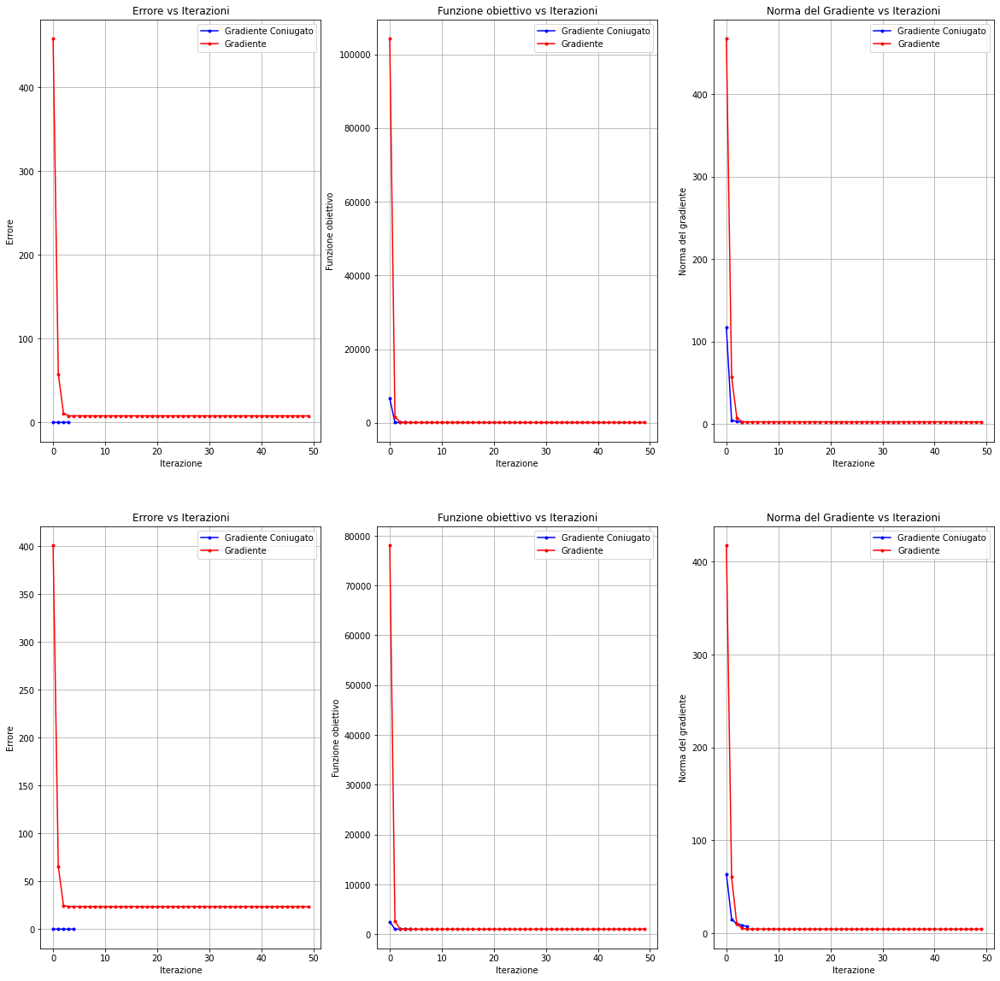

In [ ]:
#Plots comparing properties of the two methods on each execution
plt.figure(figsize=(20, 20))

#First execution of both methods
ax1 = plt.subplot(2, 3, 1)
plt.plot(errorData1Gc, '.-', color='blue')
plt.plot(exe1G[2], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Errore')
plt.title('Errore vs Iterazioni')
plt.grid()

ax2 = plt.subplot(2, 3, 2)
plt.plot(funData1Gc, '.-', color='blue')
plt.plot(exe1G[3], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Funzione obiettivo')
plt.title('Funzione obiettivo vs Iterazioni')
plt.grid()

ax3 = plt.subplot(2, 3, 3)
plt.plot(normData1Gc, '.-', color='blue')
plt.plot(exe1G[4], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Norma del gradiente')
plt.title('Norma del Gradiente vs Iterazioni')
plt.grid()

#Second execution of both methods
ax4 = plt.subplot(2, 3, 4)
plt.plot(errorData2Gc, '.-', color='blue')
plt.plot(exe2G[2], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Errore')
plt.title('Errore vs Iterazioni')
plt.grid()

ax5 = plt.subplot(2, 3, 5)
plt.plot(funData2Gc, '.-', color='blue')
plt.plot(exe2G[3], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Funzione obiettivo')
plt.title('Funzione obiettivo vs Iterazioni')
plt.grid()

ax6 = plt.subplot(2, 3, 6)
plt.plot(normData2Gc, '.-', color='blue')
plt.plot(exe2G[4], '.-', color='red')
plt.legend(("Gradiente Coniugato", "Gradiente"))
plt.xlabel('Iterazione')
plt.ylabel('Norma del gradiente')
plt.title('Norma del Gradiente vs Iterazioni')
plt.grid()

plt.show()

## 4) Variazione Totale (Facoltativo) 

Un altra funzione adatta come termine di regolarizzazione è la Variazione Totale. Data $u$ immagine di dimensioni $m\times n$ la variazione totale $TV$ di $u$ è definit come:
\begin{align*}
  TV(u) = \sum_i^n{\sum_j^m{\sqrt{||\nabla u(i, j)||_2^2 + \epsilon^2}}}
\end{align*}
Per calcolare il gradiente dell'immagine $\nabla u$ usiamo la funzione `np.gradient` che approssima la derivata per ogni pixel calcolando la differenza tra pixel adiacenti. I risultati sono due immagini della stessa dimensione dell'immagine in input, una che rappresenta il valore della derivata orizzontale `dx` e l'altra della derivata verticale `dy`. Il gradiente dell'immagine nel punto $(i, j)$ è quindi un vettore di due componenti, uno orizzontale contenuto in `dx` e uno verticale in `dy`.

Come nei casi precedenti il problema di minimo che si va a risolvere è il seguente:
\begin{align*}
  x^* = \arg\min_x \frac{1}{2} ||Ax - b||_2^2 + \lambda TV(u)
\end{align*}
il cui gradiente $\nabla f$ è dato da
\begin{align*}
\nabla f(x) = (A^TAx - A^Tb)  + \lambda \nabla TV(x)
\end{align*}

Utilizzando il metodo del gradiente implementato a lezione, calcolare la soluzione del precendente problema di minimo regolarizzato per differenti valori di $\lambda$. 


---
Per risolvere il problema di minimo è necessario anche calcolare il gradiente della variazione totale che è definito nel modo seguente
\begin{align*}
  \nabla TV(u) = -div\left(\frac{\nabla u}{\sqrt{||\nabla u||_2^2 + \epsilon^2}}\right)
\end{align*}

\begin{align*}
  div(F) = \frac{\partial F_x}{\partial x} + \frac{\partial F_y}{\partial y}
\end{align*}

$div(F)$ è la divergenza del campo vettoriale $F$, nel nostro caso $F$ ha due componenti dati dal gradiente dell'immagine $\nabla u$ scalato per il valore $ \frac{1}{\sqrt{||\nabla u||_2^2 + \epsilon^2}}$. Per calcolare la divergenza bisogna calcolare la derivata orizzontale $\frac{\partial F_x}{\partial x}$ della componente $x$ di $F$ e sommarla alla derivata verticale $\frac{\partial F_y}{\partial y}$ della componente $y$ di $F$. Per specificare in quale direzione calcolare la derivata con la funzione `np.gradient` utilizziamo il parametro `axis = 0` per l'orizzontale e `axis = 1` per la verticale.

In [ ]:
eps = 1e-2

# Variazione totale
def totvar(x):
  # Calcola il gradiente di x
  dx, dy = np.gradient(x)
  n2 = np.square(dx) + np.square(dy)

  # Calcola la variazione totale di x
  tv = np.sqrt(n2 + eps**2).sum()
  return tv

# Gradiente della variazione totale
def grad_totvar(x):
  # Calcola il numeratore della frazione
  dx, dy = np.gradient(x)

  # Calcola il denominatore della frazione
  n2 = np.square(dx) + np.square(dy)
  den = np.sqrt(n2 + eps**2)

  # Calcola le due componenti di F dividendo il gradiente per il denominatore
  Fx = dx / den
  Fy = dy / den

  # Calcola la derivata orizzontale di Fx 
  dFdx = np.gradient(Fx, axis=0)
  
  # Calcola la derivata verticale di Fy
  dFdy = np.gradient(Fy, axis=1)

  # Calcola la divergenza 
  div = (dFdx + dFdy)

  # Restituisci il valore del gradiente della variazione totale
  return -div

In [ ]:
#Function to be minimized using Total Variation method
def fl2(x, b, K, l):
    X = x.reshape(dim, dim)
    res = 1/2 * np.linalg.norm(A(X, K) - b, 2)**2 + l * totvar(X)
    return res

#Gradient of the above funtion
def dfl2(x, b, K, l):
    X = x.reshape(dim, dim)
    res = AT(A(X, K), K) - AT(b, K) + l * grad_totvar(X)
    res = np.asarray(res).reshape(-1)
    return res


index = [0, 8, 9]
tot_var = []
x0 = np.array([1]*dim*dim)

#Calculate reconstruction using Total Variation method of an image with sigma=s and lambda=l
def calculate_tot_var(i, s, l):
    res5 = minimize_custom(fl2, x0, (images[i][s-1]["b5"], images[i][s-1]["K5"], l/100), dfl2)
    regular5 = res5[0].reshape(dim, dim)
    PSNR5 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular5)
    MSE5 = metrics.mean_squared_error(images[i][s-1]["X"], regular5)
    res7 = minimize_custom(fl2, x0, (images[i][s-1]["b7"], images[i][s-1]["K7"], l/100), dfl2)
    regular7 = res7[0].reshape(dim, dim)
    PSNR7 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular7)
    MSE7 = metrics.mean_squared_error(images[i][s-1]["X"], regular7)
    res9 = minimize_custom(fl2, x0, (images[i][s-1]["b9"], images[i][s-1]["K9"], l/100), dfl2)
    regular9 = res9[0].reshape(dim, dim)
    PSNR9 = metrics.peak_signal_noise_ratio(images[i][s-1]["X"], regular9)
    MSE9 = metrics.mean_squared_error(images[i][s-1]["X"], regular9)
    return {"Regular5": regular5, "PSNR5": PSNR5, "MSE5": MSE5, "Regular7": regular7, "PSNR7": PSNR7, "MSE7": MSE7, "Regular9": regular9, "PSNR9": PSNR9, "MSE9": MSE9}


In [ ]:
#Calculate Total Variation reconstruction of 3 images, each with multiple corruption parameters
for i in range(len(index)):
    tot_var.append([])
    for s in range(1, 6):
        tot_var[i].append([])
        for l in range(1, 5):
            tot_var[i][s-1].append(calculate_tot_var(index[i], s, l))

#Print the reconstructed images
print("\nRegolarizzazione con Variazione Totale\n")
print_reg(tot_var, index)


Regolarizzazione con Variazione Totale

Image	Sigma	Lambda	PSNR5	PSNR7	PSNR9	MSE5	MSE7	MSE9 \\
0	0.01	0.01	39.99	36.91	35.94	0.00010	0.00020	0.00025 \\
0	0.01	0.02	41.44	36.71	35.93	0.00007	0.00021	0.00026 \\
0	0.01	0.03	36.50	36.10	35.11	0.00022	0.00025	0.00031 \\
0	0.01	0.04	35.61	34.73	35.70	0.00027	0.00034	0.00027 \\
0	0.02	0.01	38.11	36.37	35.55	0.00015	0.00023	0.00028 \\
0	0.02	0.02	40.15	36.03	35.52	0.00010	0.00025	0.00028 \\
0	0.02	0.03	35.88	34.66	35.91	0.00026	0.00034	0.00026 \\
0	0.02	0.04	34.36	34.18	33.83	0.00037	0.00038	0.00041 \\
0	0.03	0.01	35.42	35.48	34.95	0.00029	0.00028	0.00032 \\
0	0.03	0.02	38.01	35.56	35.14	0.00016	0.00028	0.00031 \\
0	0.03	0.03	35.66	34.52	34.96	0.00027	0.00035	0.00032 \\
0	0.03	0.04	34.17	33.89	33.62	0.00038	0.00041	0.00043 \\
0	0.04	0.01	32.78	34.24	34.06	0.00053	0.00038	0.00039 \\
0	0.04	0.02	35.05	35.06	34.69	0.00031	0.00031	0.00034 \\
0	0.04	0.03	34.96	34.18	33.68	0.00032	0.00038	0.00043 \\
0	0.04	0.04	34.03	33.61	33.35	0.00040	0.00044	0.0

In [ ]:
#Print the actual images
#Each method is for two different images
def show_images1(X, b5, PSNR5):
    plt.figure(figsize=(40, 40))

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(X, cmap='gray', vmin=0, vmax=1)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    plt.title('Immagine Originale', y = 1.01, fontsize=40)

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(b5, cmap='gray', vmin=0, vmax=1)
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    plt.title(f'Immagine Corrotta 5 (PSNR: {PSNR5:.2f})', y = 1.01, fontsize=40)

    plt.show()


def show_images2(b7, b9, PSNR7, PSNR9):
    plt.figure(figsize=(40, 40))

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(b7, cmap='gray', vmin=0, vmax=1)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    plt.title(f'Immagine Corrotta 7 (PSNR: {PSNR7:.2f})', y = 1.01, fontsize=40)

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(b9, cmap='gray', vmin=0, vmax=1)
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    plt.title(f'Immagine Corrotta 9 (PSNR: {PSNR9:.2f})', y = 1.01, fontsize=40)
    plt.show()


def show_images3(naive9, grad9, PSNR7, PSNR9):
    plt.figure(figsize=(40, 40))
    plt.rc('xtick', labelsize=20) #fontsize of the x tick labels
    plt.rc('ytick', labelsize=20) #fontsize of the y tick labels

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(naive9, cmap='gray', vmin=0, vmax=1)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    plt.title(f'Immagine Ricostruita naive 9 (PSNR: {PSNR7:.2f})', y = 1.01, fontsize=40)

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(grad9, cmap='gray', vmin=0, vmax=1)
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    plt.title(f'Immagine Ricostruita Tichonov GC 9 (PSNR: {PSNR9:.2f})', y = 1.01, fontsize=40)
    plt.show()
    
def show_images4(gradMet, totVar, PSNR1, PSNR2):
    plt.figure(figsize=(40, 40))
    plt.rc('xtick', labelsize=20) #fontsize of the x tick labels
    plt.rc('ytick', labelsize=20) #fontsize of the y tick labels

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(gradMet, cmap='gray', vmin=0, vmax=1)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    plt.title(f'Immagine Ricostruita Tichonov G 9 (PSNR: {PSNR1:.2f})', y = 1.01, fontsize=40)

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(totVar, cmap='gray', vmin=0, vmax=1)
    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    plt.title(f'Immagine Ricostruita Variazione Totale 9 (PSNR: {PSNR2:.2f})', y = 1.01, fontsize=40)
    plt.show()

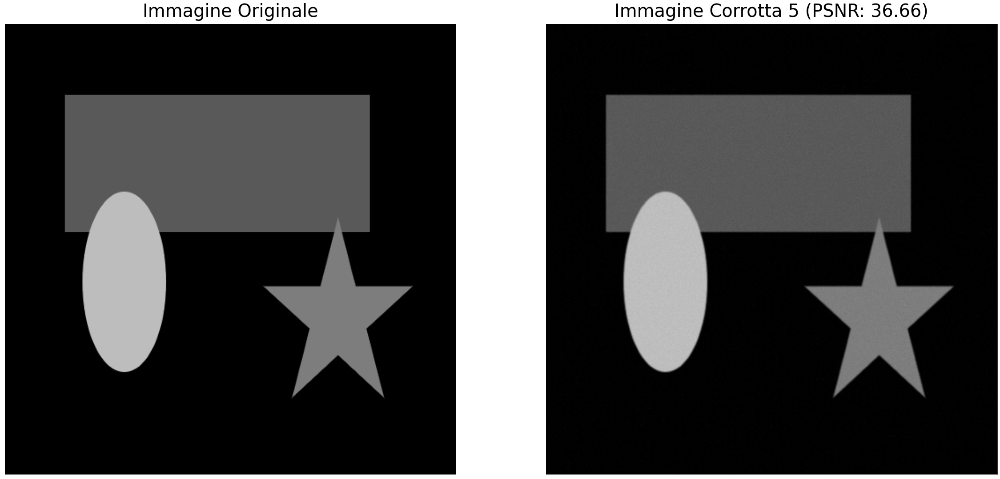

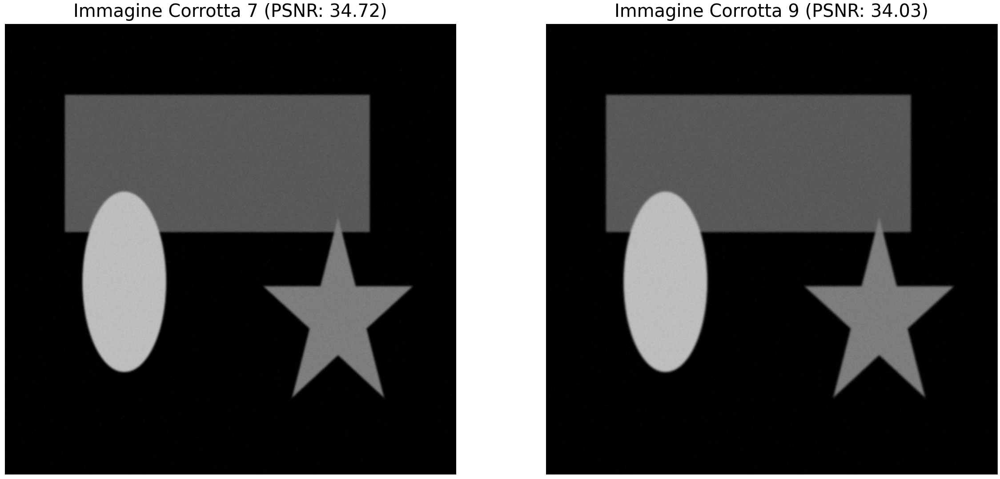

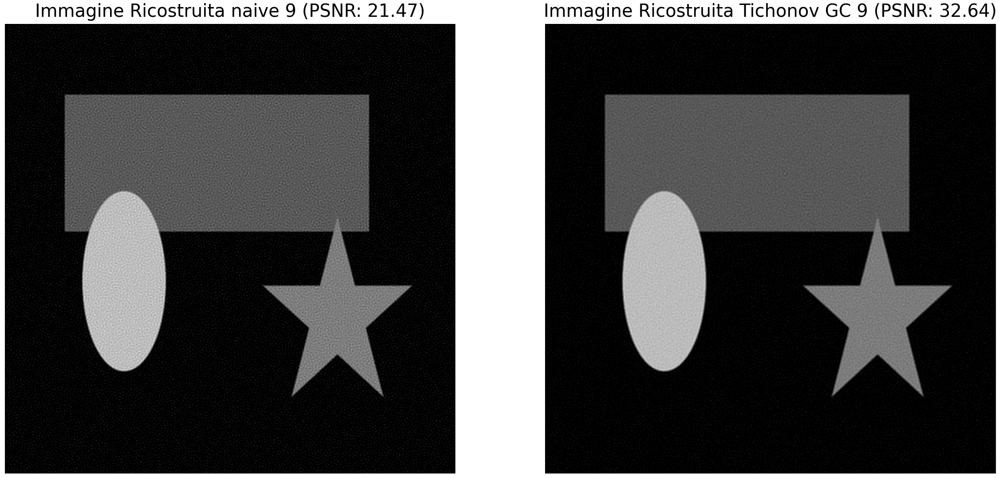

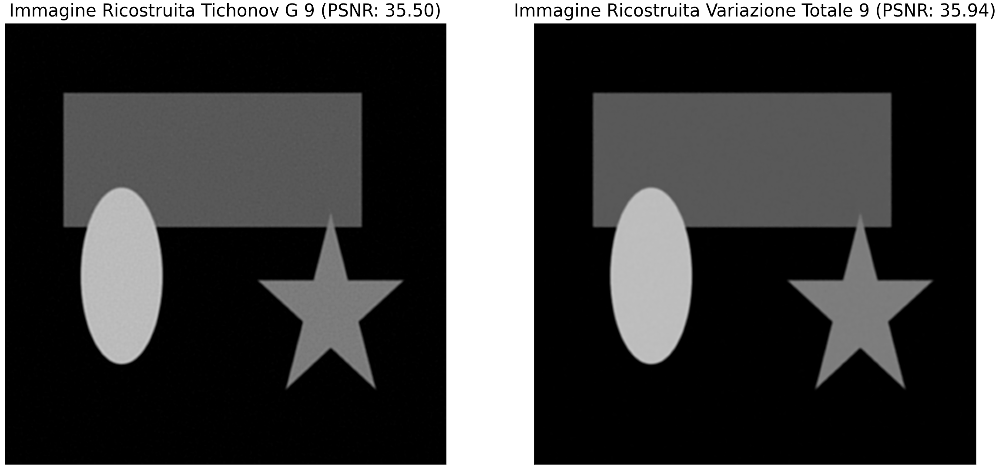

In [ ]:
#Immagine 0
show_images1(images[0][0]["X"], images[0][0]["b5"], images[0][0]["PSNR5"])
show_images2(images[0][0]["b7"], images[0][0]["b9"],images[0][0]["PSNR7"], images[0][0]["PSNR9"])
show_images3(naive[0][0]["Naive9"], regular[0][0][0]["Regular9"],naive[0][0]["PSNR7"], regular[0][0][0]["PSNR9"])
show_images4(gradMethod[0][0][0]["Regular9"], tot_var[0][0][0]["Regular9"],gradMethod[0][0][0]["PSNR9"], tot_var[0][0][0]["PSNR9"])

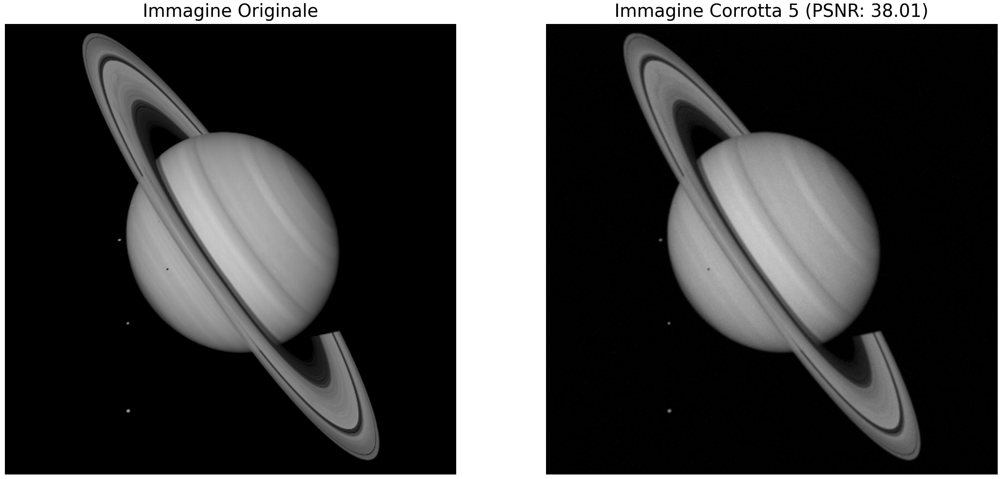

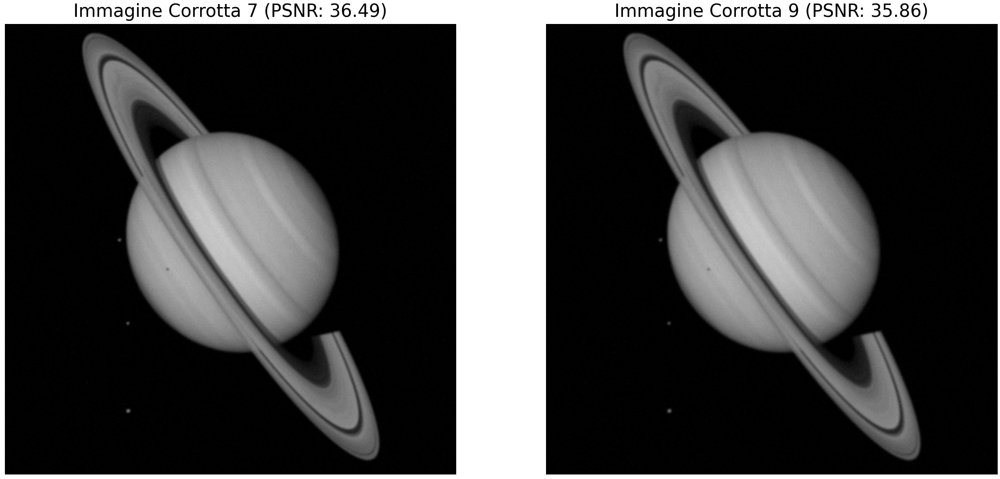

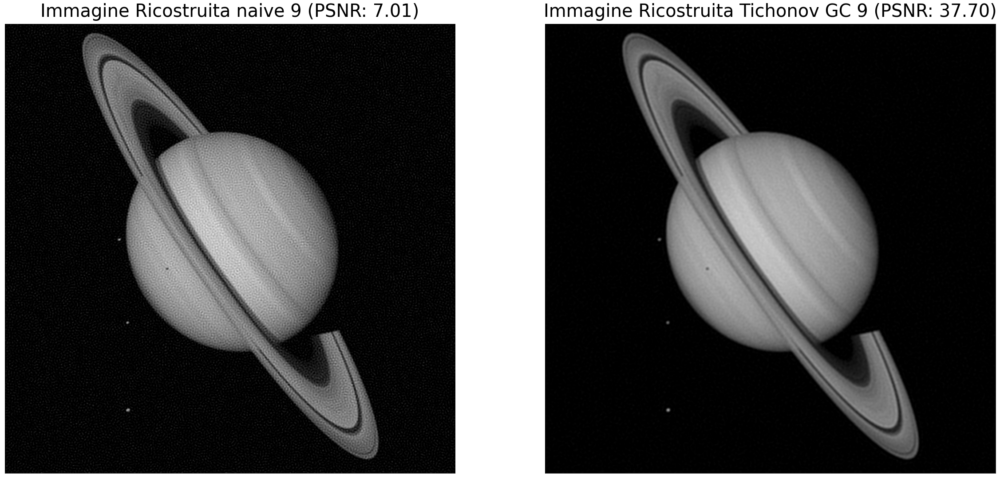

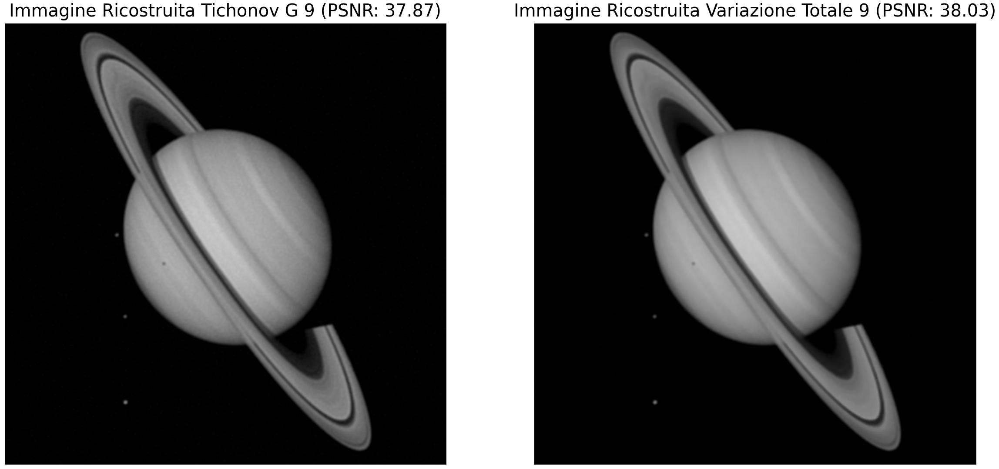

In [ ]:
#Immagine 8
show_images1(images[8][0]["X"], images[8][0]["b5"], images[8][0]["PSNR5"])
show_images2(images[8][0]["b7"], images[8][0]["b9"],images[8][0]["PSNR7"], images[8][0]["PSNR9"])
show_images3(naive[1][0]["Naive9"], regular[1][0][0]["Regular9"],naive[1][0]["PSNR7"], regular[1][0][0]["PSNR9"])
show_images4(gradMethod[1][0][0]["Regular9"], tot_var[1][0][0]["Regular9"],gradMethod[1][0][0]["PSNR9"], tot_var[1][0][0]["PSNR9"])

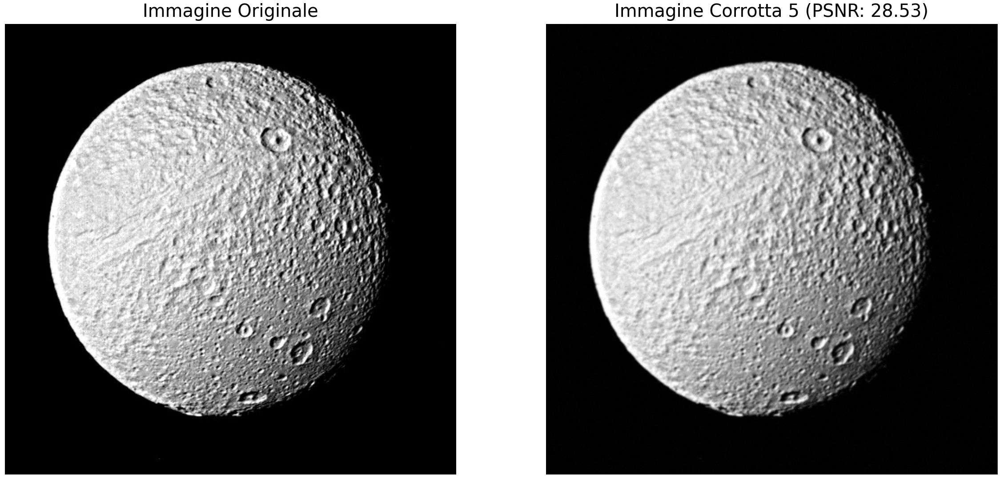

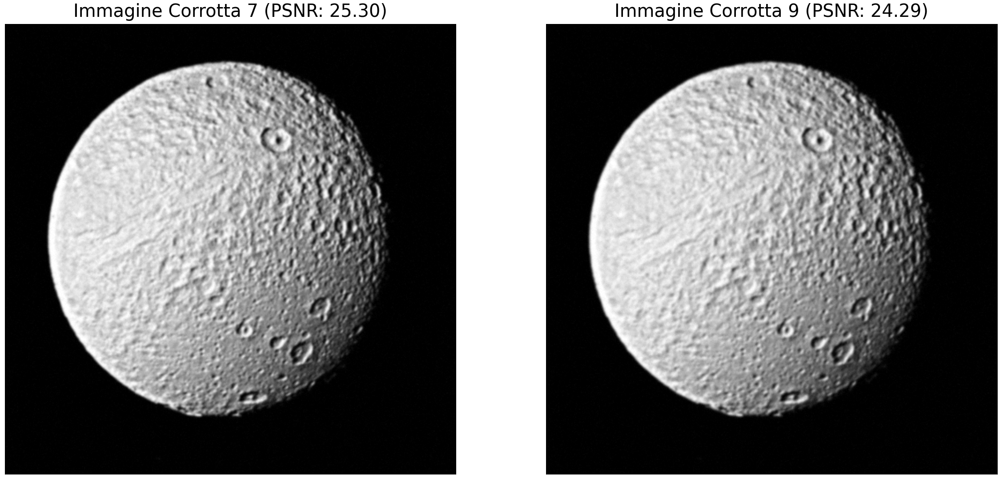

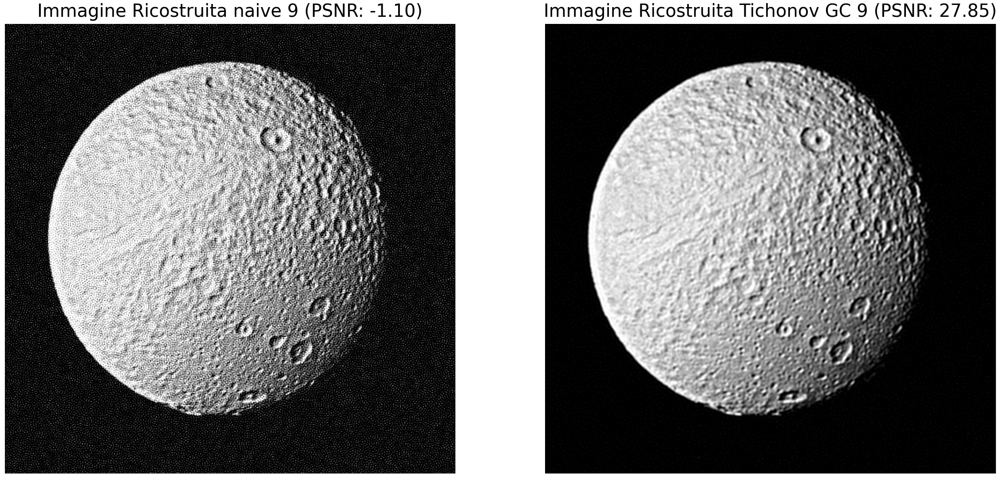

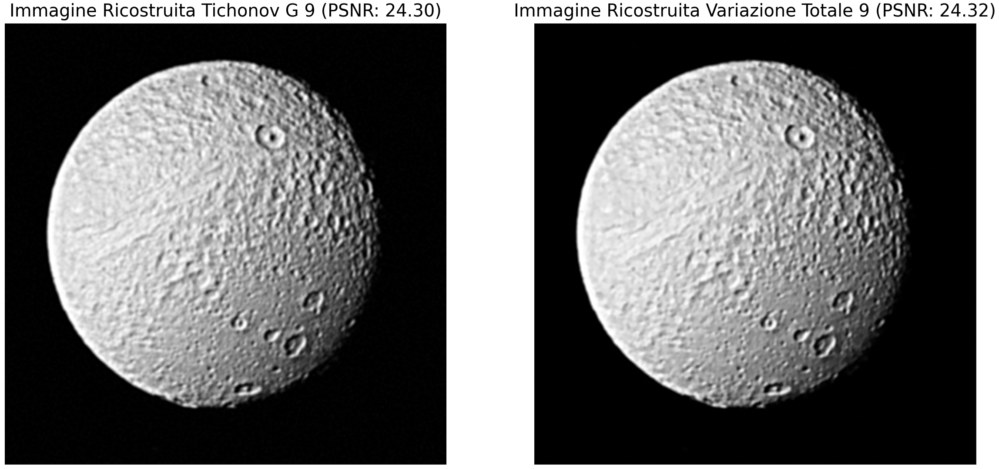

In [ ]:
#Immagine 9
show_images1(images[9][0]["X"], images[9][0]["b5"], images[9][0]["PSNR5"])
show_images2(images[9][0]["b7"], images[9][0]["b9"], images[9][0]["PSNR7"], images[9][0]["PSNR9"])
show_images3(naive[2][0]["Naive9"], regular[2][0][0]["Regular9"], naive[2][0]["PSNR7"], regular[2][0][0]["PSNR9"])
show_images4(gradMethod[2][0][0]["Regular9"], tot_var[2][0][0]["Regular9"], gradMethod[2][0][0]["PSNR9"], tot_var[2][0][0]["PSNR9"])